# **Product Recognition of Food Products**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it


Computer vision-based object detection techniques can be applied in super market settings to build a system that can identify products on store shelves.
An example of how this system could be used would be to assist visually impaired customers or automate common store management tasks like detecting low-stock or misplaced products, given an image of a shelf in a store.

## Task
Develop a computer vision system that, given a reference image for each product, is able to identify such product from one picture of a store shelf.

<figure>
<a href="https://imgbb.com/">
  <center>
  <img src="https://i.ibb.co/TwkMWnH/Screenshot-2024-04-04-at-14-54-51.png" alt="Screenshot-2024-04-04-at-14-54-51" border="0" width="300" />
</a>
</figure>

For each type of product displayed in the
shelf the system should report:
1. Number of instances;
1. Dimension of each instance (width and height in pixel of the bounding box that enclose them);
1. Position in the image reference system of each instance (center of the bounding box that enclose them).

#### Example of expected output
```
Product 0 - 2 instance found:
  Instance 1 {position: (256, 328), width: 57px, height: 80px}
  Instance 2 {position: (311, 328), width: 57px, height: 80px}
Product 1 – 1 instance found:
.
.
.
```

### Track A - Single Instance Detection
Develop an object detection system to identify single instance of products given one reference image for each item and a scene image.

The system should be able to correctly identify all the product in the shelves
image.

### Track B - Multiple Instances Detection
In addition to what achieved at step A, the system should also be able to detect multiple instances of the same product.

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify.
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios. The images contained in this folder are corrupted by noise.

#### Track A - Single Instance Detection
* **Models**: {ref1.png to ref14.png}.
* **Scenes**: {scene1.png to scene5.png}.

#### Track B - Multiple Instances Detection
* **Models**: {ref15.png to ref27.png}.
* **Scenes**: {scene6.png to scene12.png}.

In [12]:
from importlib.util import find_spec


try:
    from google.colab import drive
    drive.mount('/content/drive')

    !cp -r /content/drive/MyDrive/AssignmentsIPCV/dataset.zip ./
    !unzip dataset.zip
except ModuleNotFoundError:
    pass

## Evaluation criteria
1. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

2. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed approach.

# ASSIGNMENT:

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

models_path="dataset/models/"
scenes_path="dataset/scenes/"

products_a=[f"{models_path}ref{i}.png" for i in range(1,15)]
products_b=[f"{models_path}ref{i}.png" for i in range(15,28)]

scenes_a=[f"{scenes_path}scene{i}.png" for i in range(1,6)]
scenes_b=[f"{scenes_path}scene{i}.png" for i in range(6,13)]

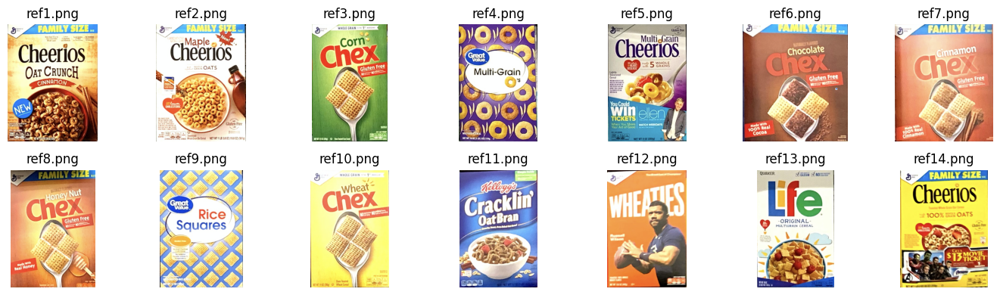

In [14]:
fig, axes = plt.subplots(2, 7, figsize=(14, 4))
axes = axes.flatten()

for i, image in enumerate(products_a):
    axes[i].imshow(cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB))
    axes[i].axis('off')
    axes[i].set_title(image[len(models_path):])

plt.tight_layout()
plt.show()

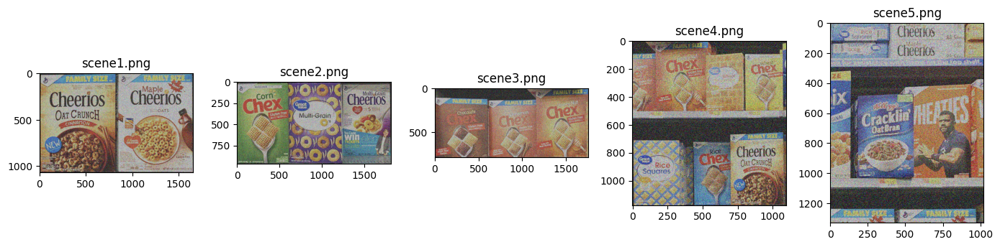

In [15]:
fig, axes = plt.subplots(1, 5, figsize=(14, 4))
axes = axes.flatten()

for i, image in enumerate(scenes_a):
    axes[i].imshow(cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB))
    # axes[i].axis('off')
    axes[i].set_title(image[len(scenes_path):])

plt.tight_layout()
plt.show()

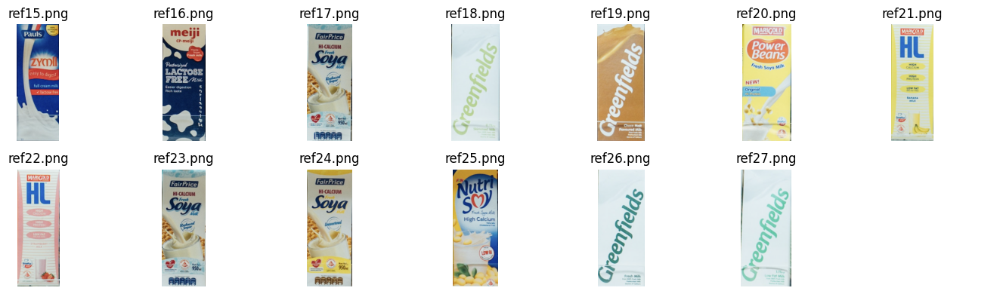

In [16]:
fig, axes = plt.subplots(2, 7, figsize=(14, 4))
axes = axes.flatten()

for i, image in enumerate(products_b):
    axes[i].imshow(cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB))
    axes[i].axis('off')
    axes[i].set_title(image[len(models_path):])
    if i==len(products_b)-1:
        for ax in axes[i+1:]:
            ax.axis('off')

plt.tight_layout()
plt.show()

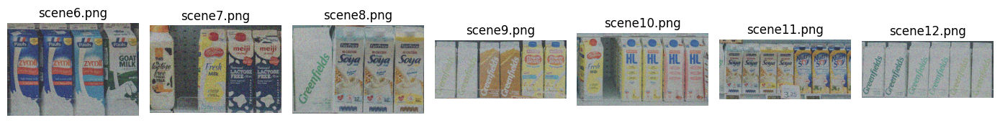

In [17]:
fig, axes = plt.subplots(1, 7, figsize=(14, 4))
axes = axes.flatten()

for i, image in enumerate(scenes_b):
    axes[i].imshow(cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB))
    axes[i].axis('off')
    axes[i].set_title(image[len(scenes_path):])

plt.tight_layout()
plt.show()

## TRACK A

In [18]:
MAX=225

def window_elements(P, W, i, j):
    elements=P[max(0,i-(W-1)//2):min(P.shape[0]-1,i+(W-1)//2)+1,max(0,j-(W-1)//2):min(P.shape[1]-1,j+(W-1)//2)+1]
    return elements.reshape((np.prod(elements.shape),))


def uncorrupted(a):
    return a[(a > 0) & (a < MAX)]


def find_median(a):
    return np.median(a)


def find_mean(a):
    return np.mean(a)


def only_0_and_MAX(a):
    for element in a:
        if element!=0 and element !=MAX:
            return False
    return True


def only_0(a):
    for element in a:
        if element!=0:
            return False
    return True


def only_MAX(a):
    for element in a:
        if element!=MAX:
            return False
    return True

def adaptive_approach(P):
    W=3
    h=2
    Wmax=9
    width,height=P.shape
    for i in range(width):
        for j in range(height):
            # print(j)
            if P[i,j]>0 and P[i,j]<MAX:
                # print('non corrotto', P[i,j])
                continue
            v=window_elements(P,W,i,j)
            V=uncorrupted(v)
            N=len(V)
            while W<=Wmax:
                if N>=W:
                    # print('n>=W', P[i,j])
                    P[i,j]=find_median(V)
                    break
                if W<Wmax:
                    if N<W: #case I
                        W+=h
                        v=window_elements(P,W,i,j)
                        V=uncorrupted(v)
                        N=len(V)
                        # print(W,N)
                        # print('1')
                    else: #case II
                        P[i,j]=find_median(V)
                        W=3
                        # print('2')
                        break
                if W==Wmax:
                    if N<W and N!=0: #caseIII
                        P[i,j]=find_mean(V)
                        # print('3')
                        break
                    if only_0_and_MAX(v): #caseIV
                        P[i,j]=find_mean(v)
                        # print('4')
                        break
                    if only_0(v): #caseV
                        P[i,j]=MAX
                        # print('5')
                        break
                    if only_MAX(v): #caseVI
                        P[i,j]=0
                        # print('6')
                        break
    return P


def denoise_image(image, filters):
    '''
    filters=[
        {name:filter1
            n_iter:...,
            params:{
                ...
            }
        },
        {name:filter2
            n_iter:...,
            params:{
                ...
            }
        },
        ...
    ]
    '''
    for filter in filters:
        for _ in range(filter['n_iter']):
            match filter['name']:
                case "mean":
                    '''
                    {"ksize" : 15}
                    '''
                    k_size = filter['params']['ksize']
                    mean_kernel = np.ones([k_size, k_size])/(k_size**2)
                    image = cv2.filter2D(image, -1, mean_kernel)

                case "median":
                    '''
                    {"ksize" : 11}
                    '''
                    image = cv2.medianBlur(image, **filter['params'])

                case "bilateral":
                    '''
                    {"d" : 3,
                    "sigmaColor" : 2,
                    "sigmaSpace" : 1.5}
                    '''
                    image = cv2.bilateralFilter(
                        image, **filter['params'])

                case 'gaussian':
                    '''
                    {"sigmaX" : 2}
                    '''
                    sigmaX = filter['params']['sigmaX']
                    ksize = 2*int(np.ceil(3*sigmaX)) + 1
                    image = cv2.GaussianBlur(image, (ksize, ksize), sigmaX)

                case 'non_local_means':
                    '''
                    {'templateWindowSize':5,"searchWindowSize":21, "h":3, "hColor": 20}
                    '''
                    image = cv2.fastNlMeansDenoisingColored(
                        image, **filter['params'])

                case 'canny':
                    '''
                    {'threshold1':5,"threshold2":21}
                    '''
                    image = cv2.Canny(image, **filter['params'])

                case "adaptive":
                    channel1 = image[:, :, 0]
                    channel2 = image[:, :, 1]
                    channel3 = image[:, :, 2]
                    image[:, :, 0] = adaptive_approach(channel1)
                    image[:, :, 1] = adaptive_approach(channel2)
                    image[:, :, 2] = adaptive_approach(channel3)

                case 'sharpen':
                    kernel = np.array([[0, -1, 0],
                                       [-1, 5, -1],
                                       [0, -1, 0]])
                    image = cv2.filter2D(image, -1, kernel=kernel)

                case 'emboss':
                    kernel = np.array([[-2, -1, 0],
                                       [-1, 1, 1],
                                       [0, 1, 2]])
                    image = cv2.filter2D(image, -1, kernel=kernel)
                case _: pass
    return image

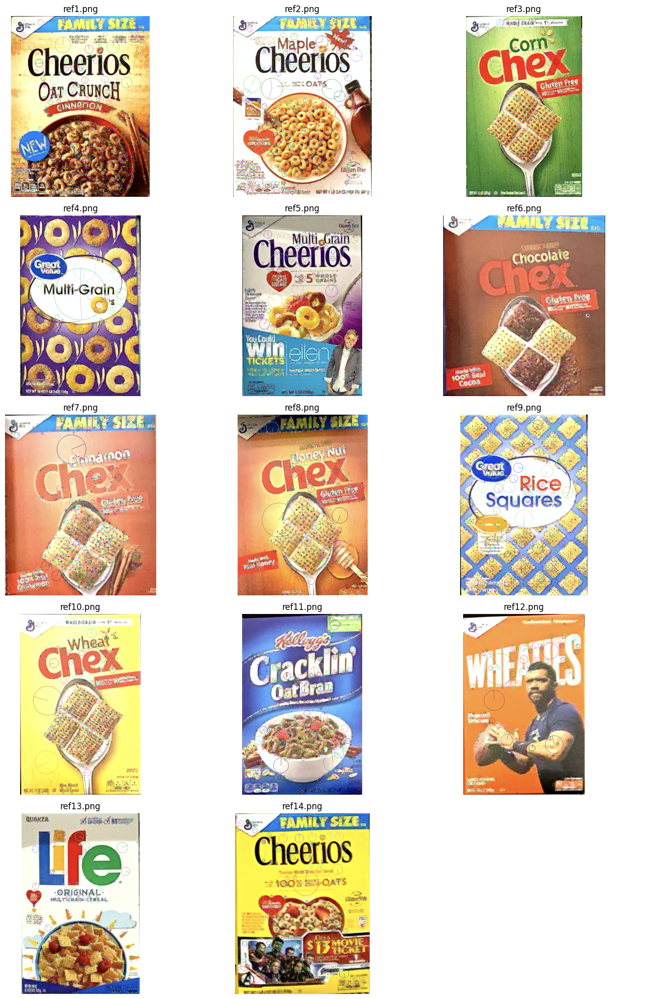

In [19]:
SHOW_FILTERED=True

products_info_a = []
fig, axes = plt.subplots(5, 3, figsize=(14, 20))
axes = axes.flatten()


for i, product in enumerate(products_a):
    image = cv2.imread(product)
    sift = cv2.xfeatures2d.SIFT_create()
    keypoints = sift.detect(image)
    products_info_a.append(list(sift.compute(image, keypoints))+[image.shape])
    if SHOW_FILTERED:
        img_kp = cv2.drawKeypoints(image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axes[i].imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
        axes[i].axis('off')
        axes[i].set_title(product[len(models_path):])
        if i==len(products_a)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

plt.tight_layout()
plt.show()

In [20]:
def normalize(image):
    return (image.astype(float)*255.0/225).astype('uint8')

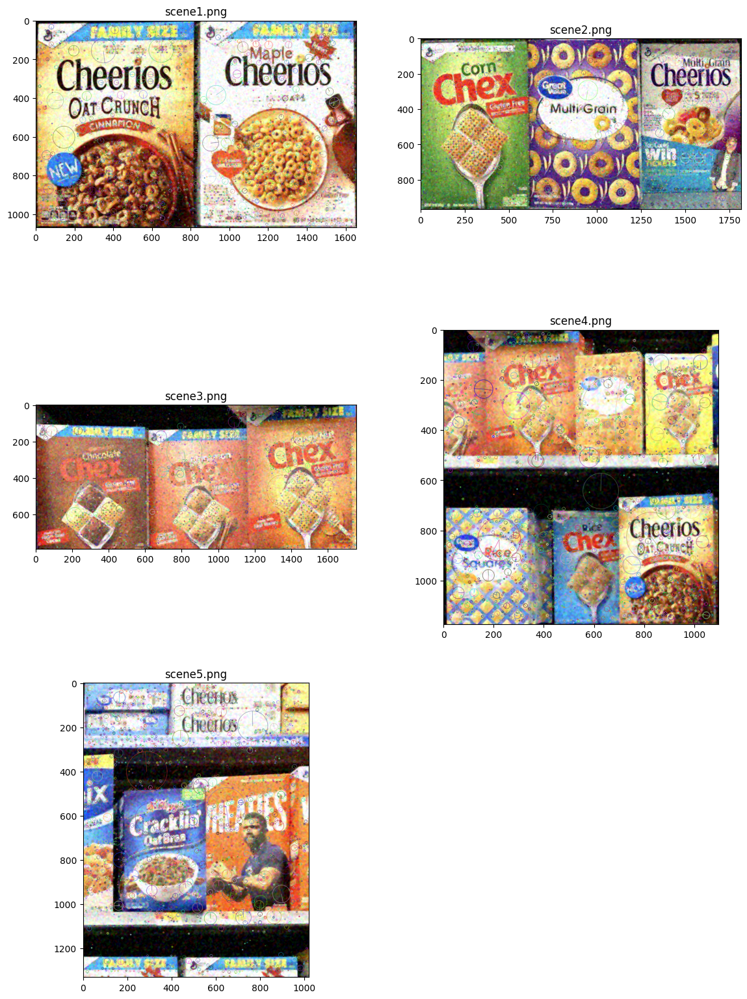

In [21]:
SHOW_FILTERED = True
# Working settings:
# [{'name': 'median', 'n_iter': 2, 'params': {'ksize': 3}},
#  {'name': 'median', 'n_iter': 2, 'params': {'ksize': 5}},
#  {'name': 'median', 'n_iter': 1, 'params': {'ksize': 7}},
#  {'matching_settings': {'min_match': 40,
#    'check_position': 'overlapping_center'}}]
settings_a = [
    {'name': 'adaptive',
        'n_iter': 0,
     },
    {'name': "median",
        "n_iter": 2,
        "params": {"ksize": 3}
     },
    {'name': "median",
        "n_iter": 2,
        "params": {"ksize": 5}
     },
    {'name': "median",
        "n_iter": 1,
        "params": {"ksize": 7}
     },
    {'name': "median",
        "n_iter": 0,
        "params": {"ksize": 3}
     },
    {'name': "median",
        "n_iter": 0,
        "params": {"ksize": 5}
     },
    {'name': 'emboss',
        'n_iter': 0,
     },
    {'name': "median",
        "n_iter": 0,
        "params": {"ksize": 3}
     },
    {'name': "median",
        "n_iter": 0,
        "params": {"ksize": 9}
     },
    {'name': "gaussian",
        "n_iter": 0,
        "params": {"sigmaX": 1.5}
     },
    {'name': "mean",
        "n_iter": 0,
        "params": {"ksize": 15}
     },
    {'name': "bilateral",
        "n_iter": 0,
        "params": {"d": 9,
                   "sigmaColor": 150,
                   "sigmaSpace": 150}
     },
    {'name': "non_local_means",
        "n_iter": 0,
        "params": {
            'templateWindowSize': 9,
            "searchWindowSize": 21,
            "h": 3,
            "hColor": 20}
     },
    {'name': "canny",
        "n_iter": 0,
        "params": {
            'threshold1': 100,
            "threshold2": 200}
     },
]


fig, axes = plt.subplots(3, 2, figsize=(14, 20))
axes = axes.flatten()

scene_info_a = []
for i, scene in enumerate(scenes_a):
    image = cv2.imread(scene)
    image = normalize(image)
    filtered_image = denoise_image(image, settings_a)
    sift = cv2.xfeatures2d.SIFT_create()
    keypoints = sift.detect(filtered_image)
    scene_info_a.append(list(sift.compute(filtered_image, keypoints))+[image.shape])
    if SHOW_FILTERED:
        img_kp = cv2.drawKeypoints(
            filtered_image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axes[i].imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
        # axes[i].axis('off')
        axes[i].set_title(scene[len(scenes_path):])
        if i == len(scenes_a)-1:
            for ax in axes[i+1:]:
                ax.axis('off')
# display_used(settings)

(968, 1816, 3)


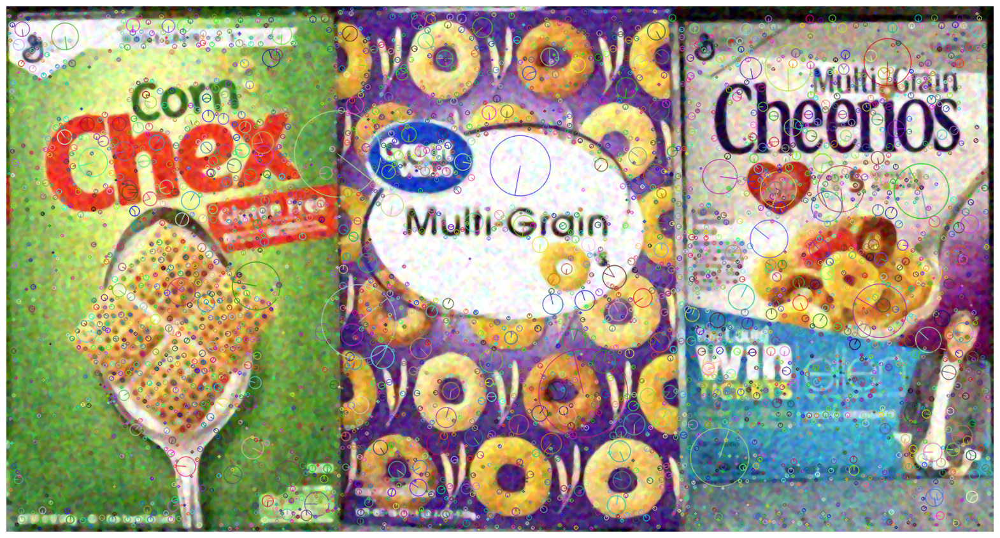

In [22]:
image = cv2.imread(scenes_a[1])
image=normalize(image)
filtered_image = denoise_image(image, settings_a[:-1])
sift = cv2.xfeatures2d.SIFT_create()
keypoints = sift.detect(filtered_image)
img_kp = cv2.drawKeypoints(
    filtered_image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
plt.axis('off');
print(image.shape)

In [23]:
def diagonal(points,point2=None):
    if point2:
        return np.sqrt((points[0]-point2[0])**2+(points[1]-point2[1])**2)
    return np.sqrt(np.sum(np.subtract(points[:1,:],points[1:,:])**2))

def get_geometry(corners):
    return {'position': tuple(np.round((np.sum(corners,axis=0)/4)[0],0).astype(int)),
        'width': f'{diagonal(corners[1:3,:]):0.0f}px',
        'height': f'{diagonal(corners[:2,:]):0.0f}px'
    }

In [24]:
results_a = {}

for i, scene in enumerate(scene_info_a, 1):
    results_a[i] = {}
    for j, product in enumerate(products_info_a, 1):
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=50)

        flann = cv2.FlannBasedMatcher(index_params, search_params)
        matches = flann.knnMatch(product[1], scene[1], k=2)
        good = []
        for m, n in matches:
            if m.distance < 0.7*n.distance:
                good.append(m)
        # num_matches = len(good)
        try: # da errori del cazzo non lo so
            src_pts = np.float32(
                [product[0][m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
            dst_pts = np.float32(
                [scene[0][m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

            M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

            matchesMask = mask.ravel().tolist()

            h, w, z = product[2]
            pts = np.float32([[0, 0], [0, h-1], [w-1, h-1],
                            [w-1, 0]]).reshape(-1, 1, 2)

            dst = np.int32(cv2.perspectiveTransform(pts, M))
            # print(dst,dst.shape)
            results_a[i][j] = {
                'match_count': np.sum(matchesMask),
                'geometry': get_geometry(dst),
                'flag':True
            }
        except cv2.error:
            print('cv2 error',f'scene {i} prod {j}')
            pass

In [25]:
def display_used(settings):
    aux=[filter for filter in settings if ( 'matching_settings' in filter.keys() or filter['n_iter']>0)]
    display(aux)


def inside(center,image_shape): # center is (x;y), shape is (rows,columns)
    # return True
    return (center[0]>=0 and center[0]<image_shape[1]) and (center[1]>=0 and center[1]<image_shape[0])


def check_boundings(point,rectangle, tollerance=None):
    try:
        pointX,pointY=point
        centerX,centerY=rectangle['position']
        sizeX=int(rectangle['width'][:-2])
        sizeY=int(rectangle['height'][:-2])
        return (centerX-sizeX/2<=pointX and pointX<=centerX+sizeX/2) and (centerY-sizeY/2<=pointY and pointY<=centerY+sizeY/2)
    except ValueError:
        return False

def flag_same_products_SI(results,method='overlapping_center',method_param=50,show_concentric_texts=False):
    '''
    per ogni scena 
        per ogni coppia di prodotti
            se hanno lo "stesso" centro flaggo a False quello con meno matches
    '''
    for scene in results.keys():
        keys=list(results[scene].keys())
        for product1 in keys:
            # results[scene][product1]["flag"]=True
            for product2 in [k for k in keys if k!=product1]:
                match method:
                    case 'center_vicinity':
                        if diagonal(results[scene][product1]["geometry"]["position"],results[scene][product2]["geometry"]["position"])<method_param:
                            if show_concentric_texts:
                                print(f'scene {scene}: products {product1} and {product2} are found to be concentric')
                            if results[scene][product1]["match_count"]>results[scene][product2]["match_count"]:
                                results[scene][product2]["flag"]=False
                            else:
                                results[scene][product1]["flag"]=False
                    case 'overlapping_center':
                        point=results[scene][product1]["geometry"]["position"] # tuple (x,y)
                        if check_boundings(point,results[scene][product2]["geometry"]):
                            if show_concentric_texts:
                                print(f'scene {scene}: products {product1} and {product2} are found to be concentric')
                            if results[scene][product1]["match_count"]>results[scene][product2]["match_count"]:
                                results[scene][product2]["flag"]=False
                            else:
                                results[scene][product1]["flag"]=False
                            
                    case _:
                        pass


def print_single_instances(results: dict,min_match,check_pos):
    max_product_len = max(len(str(product)) for scene in results for product in results[scene].keys())
    max_match_len = max(len(str(results[scene][product]["match_count"])) for scene in results for product in results[scene])
    max_x_len = max(len(str(results[scene][product]["geometry"]["position"][0])) for scene in results for product in results[scene] if inside(results[scene][product]['geometry']['position'], scene_info_a[scene-1][2]))
    max_y_len = max(len(str(results[scene][product]["geometry"]["position"][1])) for scene in results for product in results[scene] if inside(results[scene][product]['geometry']['position'], scene_info_a[scene-1][2]))
    max_width_len = max(len(str(results[scene][product]["geometry"]["width"])) for scene in results for product in results[scene])
    max_height_len = max(len(str(results[scene][product]["geometry"]["height"])) for scene in results for product in results[scene])

    for scene in results.keys():
        print(f'Scene {scene}:')
        for product in results[scene].keys():
            # print(results[scene][product]['geometry']['position'])
            if (results[scene][product]['match_count'] >= min_match and 
                 #set to false in `flag_concentric_refs` if refs refers to the same product (they both think to be the same product) 
                results[scene][product]['flag'] and
                (
                    (not check_pos) or 
                    inside(results[scene][product]['geometry']['position'], scene_info_a[scene-1][2])
                )  
                ):
                print(f"\tProduct {f'{product},':<{max_product_len+1}}"
                    + f" matches: {f'{results[scene][product]['match_count']},':<{max_match_len+1}}"
                    + f" {{position: ({str(results[scene][product]['geometry']['position'][0]):<{max_x_len}},"
                    + f" {f'{str(results[scene][product]['geometry']['position'][1])}':<{max_y_len-1}}),"
                    + f" width: {f'{results[scene][product]['geometry']['width']}':<{max_width_len-1}},"
                    + f" height: {results[scene][product]['geometry']['height']:<{max_height_len-1}}}}"
                    )

In [26]:
MIN_MATCH_COUNT = 10 # a 10 penso debba rimanere
CHECK_INSIDE_IMAGE = True
CHECK_METHOD='overlapping_center' # 'center_vicinity' or 'overlapping_center'
MIN_CENTER_DISTANCE=50
if 'matching_settings' in settings_a[-1].keys():
    settings_a[-1]={'matching_settings':{'min_match':MIN_MATCH_COUNT,
                  'inside_position_check':CHECK_METHOD if CHECK_INSIDE_IMAGE else CHECK_INSIDE_IMAGE}}
else:
    settings_a.append({'matching_settings':{'min_match':MIN_MATCH_COUNT,
                     'inside_position_check':CHECK_METHOD if CHECK_INSIDE_IMAGE else CHECK_INSIDE_IMAGE}})
            
print('Denoise settings:')
display_used(settings_a)

flag_same_products_SI(results_a,method= CHECK_METHOD,method_param=MIN_CENTER_DISTANCE,show_concentric_texts=False)
print_single_instances(results_a,MIN_MATCH_COUNT,CHECK_INSIDE_IMAGE)

Denoise settings:


[{'name': 'median', 'n_iter': 2, 'params': {'ksize': 3}},
 {'name': 'median', 'n_iter': 2, 'params': {'ksize': 5}},
 {'name': 'median', 'n_iter': 1, 'params': {'ksize': 7}},
 {'matching_settings': {'min_match': 10,
   'inside_position_check': 'overlapping_center'}}]

Scene 1:
	Product 1,  matches: 414, {position: (411 , 538), width: 802px , height: 1051px}
	Product 2,  matches: 344, {position: (1247, 533), width: 802px , height: 1049px}
Scene 2:
	Product 3,  matches: 183, {position: (304 , 492), width: 604px , height: 942px }
	Product 4,  matches: 110, {position: (928 , 481), width: 630px , height: 948px }
	Product 5,  matches: 140, {position: (1530, 451), width: 567px , height: 837px }
Scene 3:
	Product 6,  matches: 56,  {position: (296 , 455), width: 596px , height: 677px }
	Product 7,  matches: 54,  {position: (888 , 460), width: 537px , height: 652px }
	Product 8,  matches: 94,  {position: (1446, 398), width: 557px , height: 779px }
Scene 4:
	Product 1,  matches: 117, {position: (887 , 914), width: 376px , height: 505px }
	Product 8,  matches: 40,  {position: (351 , 257), width: 349px , height: 481px }
	Product 9,  matches: 35,  {position: (174 , 942), width: 324px , height: 462px }
	Product 10, matches: 16,  {position: (941 , 290), width: 257p

solutions:
scene1:1,2  
scene2:3,4,5  
scene3:6,7,8  
scene4:1,(7),8,9,10  
scene5:2,11,12  

## TRACK B

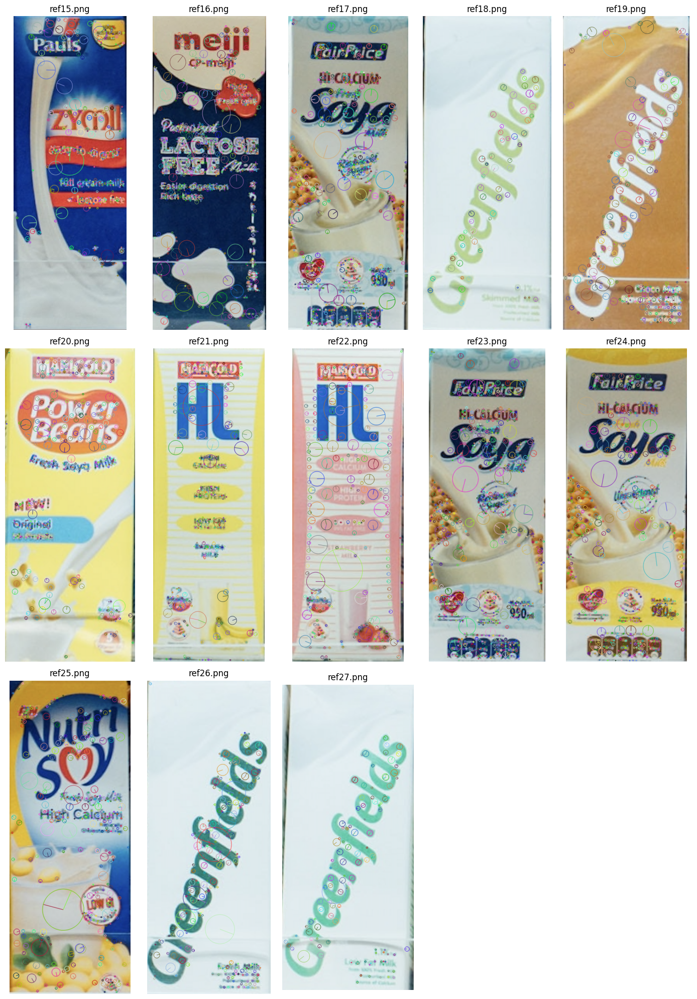

In [48]:
SHOW_FILTERED=True

products_info_b = []
fig, axes = plt.subplots(3, 5, figsize=(14, 20))
axes = axes.flatten()


for i, product in enumerate(products_b):
    image = cv2.cvtColor(cv2.imread(product), cv2.COLOR_BGR2RGB)
    sift = cv2.xfeatures2d.SIFT_create()
    keypoints = sift.detect(image)
    products_info_b.append(list(sift.compute(image, keypoints))+[image.shape])
    if SHOW_FILTERED:
        img_kp = cv2.drawKeypoints(image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axes[i].imshow(img_kp)
        axes[i].axis('off')
        axes[i].set_title(product[len(models_path):])
        if i==len(products_b)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

plt.tight_layout()
plt.show()

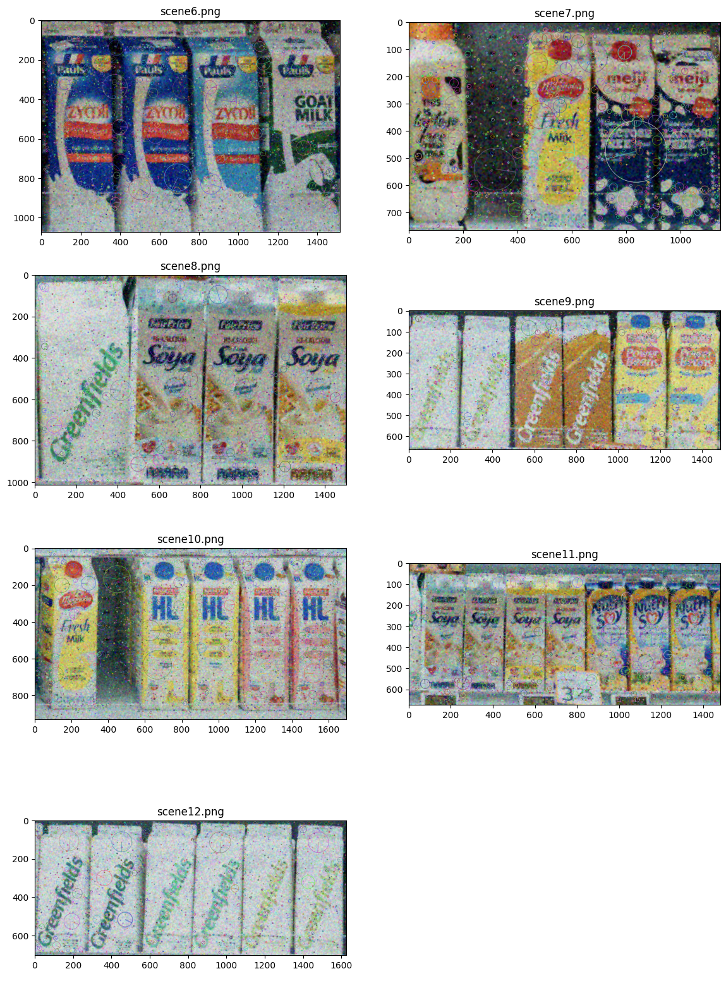

In [47]:
SHOW_FILTERED = True
# Working settings:
# [{'name': 'median', 'n_iter': 2, 'params': {'ksize': 3}},
#  {'name': 'median', 'n_iter': 2, 'params': {'ksize': 5}},
#  {'name': 'median', 'n_iter': 1, 'params': {'ksize': 7}},
#  {'matching_settings': {'min_match': 40,
#    'check_position': 'overlapping_center'}}]
settings_b = [
    {'name': "median",
        "n_iter": 1,
        "params": {"ksize": 3}
     },
    {'name': "median",
        "n_iter": 0,
        "params": {"ksize": 5}
     },
    {'name': "median",
        "n_iter": 1,
        "params": {"ksize": 7}
     }
]


fig, axes = plt.subplots(4, 2, figsize=(14, 20))
axes = axes.flatten()

scene_info_b = []
for i, scene in enumerate(scenes_b):
    image = cv2.cvtColor(cv2.imread(scene), cv2.COLOR_BGR2RGB)
    # image = normalize(image) #in pratica peggiora
    filtered_image = denoise_image(image, settings_b)
    sift = cv2.xfeatures2d.SIFT_create()
    keypoints = sift.detect(filtered_image)
    scene_info_b.append(list(sift.compute(filtered_image, keypoints))+[image.shape])
    if SHOW_FILTERED:
        img_kp = cv2.drawKeypoints(
            filtered_image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axes[i].imshow(img_kp)
        # axes[i].axis('off')
        axes[i].set_title(scene[len(scenes_path):])
        if i == len(scenes_b)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

In [29]:
def remove_used_KP_DES(keypoints, descriptors: np.array, angles):
    if angles.size == 0:
        return keypoints, descriptors
    keypoints = list(keypoints)
    geom = get_geometry(angles)
    count = 0
    for i in range(len(keypoints)):
        if check_boundings(keypoints[i-count].pt, geom):
            keypoints.pop(i-count)
            descriptors = np.delete(descriptors, i-count, 0)
            count += 1
    return tuple(keypoints), descriptors

In [57]:
results_b = {}
MIN_NUM_MATCHES = 5
for i, scene in enumerate(scene_info_b, 6):
    if i != 12:
        # continue
        pass
    results_b[i] = {}
    for j, product in enumerate(products_info_b, 15):
        results_b[i][j]=[]
        FLANN_INDEX_KDTREE = 1
        
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=150)
        flann = cv2.FlannBasedMatcher(index_params, search_params)
        
        kp_scene, des_scene=scene[:-1].copy()
        matches = flann.knnMatch(product[1], des_scene, k=2)
        good = []
        for m, n in matches:
            if m.distance < 0.8*n.distance:
                good.append(m)
        box=np.array([])
        old_des_number = 0
        
        while len(good)>MIN_NUM_MATCHES:
            try:
                kp_scene,des_scene=remove_used_KP_DES(kp_scene,des_scene,box)
                print(f'prod {j}',des_scene.shape[0])
                if des_scene.shape[0]<1:
                    break 
                matches = flann.knnMatch(product[1],des_scene,k=2)
                good = []
                for m,n in matches:
                    if m.distance < 0.8*n.distance:
                        good.append(m)

                src_pts = np.float32([product[0][m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
                dst_pts = np.float32([kp_scene[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

                M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

                matchesMask = mask.ravel().tolist()
                if np.sum(matchesMask)<MIN_NUM_MATCHES:
                    break
                h, w, z = product[2]
                pts = np.float32([[0, 0], [0, h-1], [w-1, h-1],[w-1, 0]]).reshape(-1, 1, 2)

                dst = np.int32(cv2.perspectiveTransform(pts, M))
                box=dst
                results_b[i][j].append({
                    'match_count': np.sum(matchesMask),
                    'geometry': get_geometry(dst),
                    'flag':True}
                )
                if des_scene.shape[0] == old_des_number:
                    break
                old_des_number = des_scene.shape[0]
                # print(results_b[i][j])
            except cv2.error:
                print('cv2 error',f'scene {i} prod {j}')
                print(cv2.error.msg)
                pass
        # print(j)
    # print(results_b[i])

prod 15 5553
prod 15 4581
prod 15 3536
prod 15 2660
prod 15 2167
prod 15 2167
prod 16 5553
prod 16 5553
prod 17 5553
prod 17 5551
prod 17 5548
prod 17 5040
prod 17 5034
prod 17 5034
prod 20 5553
prod 21 5553
prod 21 5551
prod 22 5553
prod 22 5549
prod 23 5553
prod 23 5549
prod 23 5546
prod 23 1973
prod 23 1966
prod 23 1964
prod 23 0
prod 24 5553
prod 24 5553
prod 25 5553
prod 26 5553
prod 27 5553
prod 15 3427
prod 16 3427
prod 16 2835
prod 16 2189
prod 16 2187
prod 16 957
prod 16 956
prod 16 955
prod 16 955
prod 17 3427
prod 17 3358
prod 17 3300
prod 17 3207
prod 17 3207
prod 19 3427
prod 20 3427
prod 20 3427
prod 21 3427
prod 21 3391
prod 21 2863
prod 21 2847
prod 21 2829
prod 21 2635
prod 21 1853
prod 21 1850
prod 21 612
prod 22 3427
prod 22 3426
prod 22 3426
prod 23 3427
prod 23 2575
prod 23 2568
prod 23 37
prod 23 36
prod 23 36
prod 24 3427
prod 24 3425
prod 24 3425
prod 25 3427
prod 25 3427
prod 26 3427
prod 27 3427
prod 15 5152
prod 16 5152
prod 16 5151
prod 16 5129
prod 16 5129


In [31]:
def flag_same_products_MI(results,method='overlapping_center',method_param=50,show_concentric_texts=False):
    '''
    per ogni scena 
        per ogni coppia di istanza
            se hanno lo "stesso" centro flaggo a False quella con meno matches
    '''
    # TODO forse va aggiusato
    for scene in results.keys():
        keys=list(results[scene].keys())
        for i,product1 in keys:
            for product2 in [k for k in keys if k!= product1]:
                for instance1 in range(len(results[scene][product1])):
                    for instance2 in range(len(results[scene][product2])):
                        match method:
                            case 'center_vicinity':
                                if diagonal(results[scene][product1][instance1]["geometry"]["position"],results[scene][product2][instance2]["geometry"]["position"])<method_param:
                                    if show_concentric_texts:
                                        print(f'scene {scene}: products {product1} and {product2} are found to be concentric')
                                    if results[scene][product1][instance1]["match_count"]>results[scene][product2][instance2]["match_count"]:
                                        results[scene][product2][instance2]["flag"]=False
                                    else:
                                        results[scene][product1][instance1]["flag"]=False
                            case 'overlapping_center':
                                point=results[scene][product1][instance1]["geometry"]["position"] # tuple (x,y)
                                if check_boundings(point,results[scene][product2][instance2]["geometry"]):
                                    if show_concentric_texts:
                                        print(f'scene {scene}: products {product1} and {product2} are found to be concentric')
                                    if results[scene][product1][instance1]["match_count"]>results[scene][product2][instance2]["match_count"]:
                                        results[scene][product2][instance2]["flag"]=False
                                    else:
                                        results[scene][product1][instance1]["flag"]=False
                                    
                            case _:
                                pass


'''
    results_b={
        scene_index:{
            product_1_index:[
                {
                    'match_count':n,
                    'geometry':geom_dict (see get_geometry()),
                    'flag':Bool
                },
                {
                    'match_count':n,
                    'geometry':geom_dict (see get_geometry()),
                    'flag':Bool
                },
                ...
            ],
            ...
        },
        ...
    }
'''
def print_multiple_instances(results: dict,min_match,check_pos):
    try:
        max_product_len = max(len(str(product)) for scene in results for product in results[scene].keys())
        max_match_len = max(len(str(product["match_count"])) for scene in results for products in results[scene] for product in results[scene][products])
        max_x_len = max(len(str(product["geometry"]["position"][0])) for scene in results for products in results[scene] for product in results[scene][products])# if inside(product['geometry']['position'], scene_info_b[scene-1][2]))
        max_y_len = max(len(str(product["geometry"]["position"][1])) for scene in results for products in results[scene] for product in results[scene][products])# if inside(product['geometry']['position'], scene_info_b[scene-1][2]))
        max_width_len = max(len(str(product["geometry"]["width"])) for scene in results for products in results[scene] for product in results[scene][products])
        max_height_len = max(len(str(product["geometry"]["height"])) for scene in results for products in results[scene] for product in results[scene][products])

        for scene in results.keys():
            print(f'Scene {scene}:')
            for products in results[scene].keys():
                printable_prods=[]
                for product in results[scene][products]:
                    if (product['match_count'] >= min_match and 
                        product['flag'] and 
                        (
                            (not check_pos) or 
                            inside(product['geometry']['position'], scene_info_b[scene-1][2])
                        )):
                        printable_prods.append(product)
                num_inside=len(printable_prods)
                if num_inside>0:
                    print(f"\tProduct {products:<{max_product_len}} - {num_inside} instance found:")
                    for i,product in enumerate(printable_prods,1):
                        print(f"\t\tInstance {i},"
                            + f" matches: {f'{product['match_count']},':<{max_match_len+1}}"
                            + f" {{position: ({str(product['geometry']['position'][0]):<{max_x_len}}"
                            + f", {f'{str(product['geometry']['position'][1])}':<{max_y_len-1}}),"
                            + f" width: {f'{product['geometry']['width']}':<{max_width_len-1}},"
                            + f" height: {product['geometry']['height']:<{max_height_len-1}}}}"
                            )
    except IndexError:
        pass
print_multiple_instances(
    results={6: {15: [{'match_count': 25,
    'geometry': {'position': (583, 622), 'width': '325px', 'height': '903px'},
    'flag': True},
   {'match_count': 26,
    'geometry': {'position': (189, 608), 'width': '327px', 'height': '864px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (938, 628), 'width': '333px', 'height': '904px'},
    'flag': True},
   {'match_count': 16,
    'geometry': {'position': (1332, 621), 'width': '326px', 'height': '887px'},
    'flag': True}],
  16: [],
  17: [{'match_count': 10,
    'geometry': {'position': (611, 84), 'width': '2px', 'height': '22px'},
    'flag': True},
   {'match_count': 10,
    'geometry': {'position': (618, 115), 'width': '138px', 'height': '7px'},
    'flag': True},
   {'match_count': 10,
    'geometry': {'position': (633, 76), 'width': '21px', 'height': '48px'},
    'flag': True},
   {'match_count': 10,
    'geometry': {'position': (613, 86), 'width': '1px', 'height': '18px'},
    'flag': True},
   {'match_count': 10,
    'geometry': {'position': (1047, 1153),
     'width': '4571px',
     'height': '23px'},
    'flag': True},
   {'match_count': 10,
    'geometry': {'position': (1314, 505), 'width': '15px', 'height': '26px'},
    'flag': True},
   {'match_count': 10,
    'geometry': {'position': (620, 86), 'width': '29px', 'height': '25px'},
    'flag': True},
   {'match_count': 7,
    'geometry': {'position': (1151, -435),
     'width': '4682px',
     'height': '3329px'},
    'flag': True}],
  18: [],
  19: [],
  20: [{'match_count': 7,
    'geometry': {'position': (1440, 570), 'width': '532px', 'height': '730px'},
    'flag': True}],
  21: [],
  22: [],
  23: [{'match_count': 7,
    'geometry': {'position': (1414, 501), 'width': '49px', 'height': '37px'},
    'flag': True},
   {'match_count': 7,
    'geometry': {'position': (619, 83), 'width': '6px', 'height': '9px'},
    'flag': True},
   {'match_count': 7,
    'geometry': {'position': (2089, 824),
     'width': '4543px',
     'height': '2360px'},
    'flag': True}],
  24: [{'match_count': 8,
    'geometry': {'position': (1289, 503), 'width': '50px', 'height': '48px'},
    'flag': True},
   {'match_count': 7,
    'geometry': {'position': (1387, 518), 'width': '25px', 'height': '46px'},
    'flag': True},
   {'match_count': 7,
    'geometry': {'position': (1328, 502), 'width': '7px', 'height': '7px'},
    'flag': True}],
  25: [],
  26: [],
  27: []},
 7: {15: [],
  16: [{'match_count': 48,
    'geometry': {'position': (794, 462), 'width': '218px', 'height': '599px'},
    'flag': True},
   {'match_count': 80,
    'geometry': {'position': (1030, 462), 'width': '216px', 'height': '598px'},
    'flag': True},
   {'match_count': 11,
    'geometry': {'position': (438, 46), 'width': '1px', 'height': '0px'},
    'flag': True},
   {'match_count': 9,
    'geometry': {'position': (441, 42), 'width': '6px', 'height': '26px'},
    'flag': True},
   {'match_count': 10,
    'geometry': {'position': (456, 54), 'width': '7px', 'height': '1px'},
    'flag': True},
   {'match_count': 11,
    'geometry': {'position': (216, 120), 'width': '2px', 'height': '1px'},
    'flag': True},
   {'match_count': 9,
    'geometry': {'position': (456, 55), 'width': '0px', 'height': '0px'},
    'flag': True},
   {'match_count': 9,
    'geometry': {'position': (456, 55), 'width': '1px', 'height': '1px'},
    'flag': True},
   {'match_count': 8,
    'geometry': {'position': (220, 514), 'width': '10px', 'height': '9px'},
    'flag': True}],
  17: [],
  18: [],
  19: [],
  20: [{'match_count': 9,
    'geometry': {'position': (2341, -93), 'width': '185px', 'height': '809px'},
    'flag': True},
   {'match_count': 9,
    'geometry': {'position': (-164, 741), 'width': '242px', 'height': '336px'},
    'flag': True},
   {'match_count': 9,
    'geometry': {'position': (618, 419), 'width': '350px', 'height': '518px'},
    'flag': True}],
  21: [],
  22: [],
  23: [{'match_count': 7,
    'geometry': {'position': (648, 240), 'width': '1053px', 'height': '309px'},
    'flag': True},
   {'match_count': 9,
    'geometry': {'position': (514, 435), 'width': '0px', 'height': '0px'},
    'flag': True},
   {'match_count': 7,
    'geometry': {'position': (863, 664), 'width': '451px', 'height': '824px'},
    'flag': True},
   {'match_count': 7,
    'geometry': {'position': (242, 485), 'width': '279px', 'height': '50px'},
    'flag': True},
   {'match_count': 7,
    'geometry': {'position': (522, 411), 'width': '612px', 'height': '183px'},
    'flag': True},
   {'match_count': 7,
    'geometry': {'position': (117, 516), 'width': '516px', 'height': '472px'},
    'flag': True},
   {'match_count': 7,
    'geometry': {'position': (308, 43), 'width': '96px', 'height': '100px'},
    'flag': True},
   {'match_count': 7,
    'geometry': {'position': (558, 555), 'width': '325px', 'height': '322px'},
    'flag': True}],
  24: [],
  25: [],
  26: [],
  27: []},
 8: {15: [],
  16: [{'match_count': 11,
    'geometry': {'position': (2, 41), 'width': '56px', 'height': '56px'},
    'flag': True},
   {'match_count': 8,
    'geometry': {'position': (1319, 238), 'width': '0px', 'height': '0px'},
    'flag': True}],
  17: [{'match_count': 46,
    'geometry': {'position': (648, 567), 'width': '324px', 'height': '853px'},
    'flag': True},
   {'match_count': 66,
    'geometry': {'position': (988, 574), 'width': '329px', 'height': '853px'},
    'flag': True},
   {'match_count': 47,
    'geometry': {'position': (1341, 575), 'width': '327px', 'height': '846px'},
    'flag': True},
   {'match_count': 7,
    'geometry': {'position': (234, 634), 'width': '19px', 'height': '25px'},
    'flag': True}],
  18: [{'match_count': 17,
    'geometry': {'position': (259, 578), 'width': '315px', 'height': '754px'},
    'flag': True}],
  19: [],
  20: [],
  21: [],
  22: [],
  23: [{'match_count': 36,
    'geometry': {'position': (987, 567), 'width': '321px', 'height': '869px'},
    'flag': True},
   {'match_count': 61,
    'geometry': {'position': (646, 558), 'width': '316px', 'height': '874px'},
    'flag': True},
   {'match_count': 55,
    'geometry': {'position': (1340, 568), 'width': '323px', 'height': '865px'},
    'flag': True},
   {'match_count': 8,
    'geometry': {'position': (236, 612), 'width': '74px', 'height': '76px'},
    'flag': True},
   {'match_count': 7,
    'geometry': {'position': (454, 580), 'width': '514px', 'height': '293px'},
    'flag': True},
   {'match_count': 7,
    'geometry': {'position': (82, 789), 'width': '4px', 'height': '55px'},
    'flag': True},
   {'match_count': 7,
    'geometry': {'position': (96, 726), 'width': '20px', 'height': '20px'},
    'flag': True}],
  24: [{'match_count': 36,
    'geometry': {'position': (1338, 577), 'width': '323px', 'height': '844px'},
    'flag': True},
   {'match_count': 25,
    'geometry': {'position': (985, 577), 'width': '320px', 'height': '855px'},
    'flag': True},
   {'match_count': 60,
    'geometry': {'position': (645, 571), 'width': '323px', 'height': '856px'},
    'flag': True}],
  25: [],
  26: [{'match_count': 32,
    'geometry': {'position': (260, 570), 'width': '305px', 'height': '743px'},
    'flag': True}],
  27: [{'match_count': 30,
    'geometry': {'position': (260, 570), 'width': '322px', 'height': '757px'},
    'flag': True}]},
 9: {15: [],
  16: [{'match_count': 8,
    'geometry': {'position': (1431, 8), 'width': '47px', 'height': '33px'},
    'flag': True},
   {'match_count': 8,
    'geometry': {'position': (1408, 29), 'width': '143px', 'height': '122px'},
    'flag': True}],
  17: [],
  18: [],
  19: [{'match_count': 24,
    'geometry': {'position': (620, 374), 'width': '221px', 'height': '551px'},
    'flag': True},
   {'match_count': 24,
    'geometry': {'position': (849, 375), 'width': '215px', 'height': '565px'},
    'flag': True},
   {'match_count': 7,
    'geometry': {'position': (1364, 29), 'width': '0px', 'height': '0px'},
    'flag': True},
   {'match_count': 7,
    'geometry': {'position': (1366, 32), 'width': '6px', 'height': '14px'},
    'flag': True}],
  20: [{'match_count': 16,
    'geometry': {'position': (1103, 376), 'width': '238px', 'height': '576px'},
    'flag': True},
   {'match_count': 19,
    'geometry': {'position': (1360, 376), 'width': '226px', 'height': '559px'},
    'flag': True}],
  21: [],
  22: [],
  23: [],
  24: [],
  25: [],
  26: [],
  27: []},
 10: {15: [],
  16: [{'match_count': 12,
    'geometry': {'position': (348, 191), 'width': '4px', 'height': '3px'},
    'flag': True}],
  17: [],
  18: [],
  19: [],
  20: [{'match_count': 15,
    'geometry': {'position': (179, 658), 'width': '100px', 'height': '205px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (-77, 1278), 'width': '172px', 'height': '756px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (179, 658), 'width': '100px', 'height': '205px'},
    'flag': True},
   {'match_count': 14,
    'geometry': {'position': (181, 659), 'width': '96px', 'height': '215px'},
    'flag': True},
   {'match_count': 13,
    'geometry': {'position': (184, 637), 'width': '82px', 'height': '182px'},
    'flag': True},
   {'match_count': 14,
    'geometry': {'position': (181, 659), 'width': '96px', 'height': '215px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (179, 658), 'width': '100px', 'height': '205px'},
    'flag': True},
   {'match_count': 14,
    'geometry': {'position': (190, 624), 'width': '87px', 'height': '170px'},
    'flag': True},
   {'match_count': 13,
    'geometry': {'position': (142, 785), 'width': '137px', 'height': '319px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (179, 658), 'width': '100px', 'height': '205px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (179, 658), 'width': '100px', 'height': '205px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (179, 658), 'width': '100px', 'height': '205px'},
    'flag': True},
   {'match_count': 14,
    'geometry': {'position': (190, 624), 'width': '87px', 'height': '170px'},
    'flag': True},
   {'match_count': 13,
    'geometry': {'position': (184, 637), 'width': '82px', 'height': '182px'},
    'flag': True},
   {'match_count': 13,
    'geometry': {'position': (142, 785), 'width': '137px', 'height': '319px'},
    'flag': True},
   {'match_count': 16,
    'geometry': {'position': (173, 680), 'width': '109px', 'height': '230px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (179, 658), 'width': '100px', 'height': '205px'},
    'flag': True},
   {'match_count': 16,
    'geometry': {'position': (176, 674), 'width': '98px', 'height': '229px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (179, 658), 'width': '100px', 'height': '205px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (-77, 1278), 'width': '172px', 'height': '756px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (-77, 1278), 'width': '172px', 'height': '756px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (-77, 1278), 'width': '172px', 'height': '756px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (179, 658), 'width': '100px', 'height': '205px'},
    'flag': True},
   {'match_count': 12,
    'geometry': {'position': (206, 596), 'width': '62px', 'height': '157px'},
    'flag': True},
   {'match_count': 12,
    'geometry': {'position': (206, 596), 'width': '62px', 'height': '157px'},
    'flag': True},
   {'match_count': 12,
    'geometry': {'position': (206, 596), 'width': '62px', 'height': '157px'},
    'flag': True},
   {'match_count': 12,
    'geometry': {'position': (206, 596), 'width': '62px', 'height': '157px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (179, 658), 'width': '100px', 'height': '205px'},
    'flag': True},
   {'match_count': 16,
    'geometry': {'position': (176, 674), 'width': '98px', 'height': '229px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (-77, 1278), 'width': '172px', 'height': '756px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (179, 658), 'width': '100px', 'height': '205px'},
    'flag': True},
   {'match_count': 13,
    'geometry': {'position': (184, 637), 'width': '82px', 'height': '182px'},
    'flag': True},
   {'match_count': 12,
    'geometry': {'position': (187, 630), 'width': '76px', 'height': '180px'},
    'flag': True},
   {'match_count': 12,
    'geometry': {'position': (206, 596), 'width': '62px', 'height': '157px'},
    'flag': True},
   {'match_count': 14,
    'geometry': {'position': (189, 612), 'width': '73px', 'height': '153px'},
    'flag': True},
   {'match_count': 17,
    'geometry': {'position': (186, 634), 'width': '84px', 'height': '184px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (179, 658), 'width': '100px', 'height': '205px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (179, 658), 'width': '100px', 'height': '205px'},
    'flag': True},
   {'match_count': 14,
    'geometry': {'position': (190, 624), 'width': '87px', 'height': '170px'},
    'flag': True},
   {'match_count': 14,
    'geometry': {'position': (190, 624), 'width': '87px', 'height': '170px'},
    'flag': True},
   {'match_count': 16,
    'geometry': {'position': (188, 623), 'width': '85px', 'height': '168px'},
    'flag': True},
   {'match_count': 13,
    'geometry': {'position': (72, 1062), 'width': '147px', 'height': '758px'},
    'flag': True},
   {'match_count': 12,
    'geometry': {'position': (206, 596), 'width': '62px', 'height': '157px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (179, 658), 'width': '100px', 'height': '205px'},
    'flag': True},
   {'match_count': 12,
    'geometry': {'position': (206, 596), 'width': '62px', 'height': '157px'},
    'flag': True},
   {'match_count': 12,
    'geometry': {'position': (206, 596), 'width': '62px', 'height': '157px'},
    'flag': True},
   {'match_count': 12,
    'geometry': {'position': (206, 596), 'width': '62px', 'height': '157px'},
    'flag': True},
   {'match_count': 12,
    'geometry': {'position': (206, 596), 'width': '62px', 'height': '157px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (179, 658), 'width': '100px', 'height': '205px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (179, 658), 'width': '100px', 'height': '205px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (18, 474), 'width': '509px', 'height': '1649px'},
    'flag': True}],
  21: [{'match_count': 7,
    'geometry': {'position': (1206, 184),
     'width': '847px',
     'height': '2050px'},
    'flag': True},
   {'match_count': 19,
    'geometry': {'position': (712, 542), 'width': '249px', 'height': '693px'},
    'flag': True}],
  22: [{'match_count': 12,
    'geometry': {'position': (1260, 537), 'width': '249px', 'height': '700px'},
    'flag': True},
   {'match_count': 13,
    'geometry': {'position': (1527, 535), 'width': '247px', 'height': '698px'},
    'flag': True},
   {'match_count': 13,
    'geometry': {'position': (984, 552), 'width': '270px', 'height': '707px'},
    'flag': True},
   {'match_count': 20,
    'geometry': {'position': (707, 510), 'width': '227px', 'height': '654px'},
    'flag': True}],
  23: [],
  24: [],
  25: [],
  26: [],
  27: []},
 11: {15: [],
  16: [],
  17: [{'match_count': 15,
    'geometry': {'position': (168, 364), 'width': '187px', 'height': '477px'},
    'flag': True},
   {'match_count': 18,
    'geometry': {'position': (359, 364), 'width': '184px', 'height': '468px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (556, 366), 'width': '187px', 'height': '480px'},
    'flag': True},
   {'match_count': 17,
    'geometry': {'position': (748, 370), 'width': '191px', 'height': '484px'},
    'flag': True}],
  18: [],
  19: [],
  20: [],
  21: [],
  22: [],
  23: [{'match_count': 13,
    'geometry': {'position': (358, 356), 'width': '182px', 'height': '486px'},
    'flag': True},
   {'match_count': 24,
    'geometry': {'position': (166, 360), 'width': '181px', 'height': '488px'},
    'flag': True},
   {'match_count': 18,
    'geometry': {'position': (556, 362), 'width': '183px', 'height': '491px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (746, 364), 'width': '184px', 'height': '492px'},
    'flag': True}],
  24: [{'match_count': 12,
    'geometry': {'position': (556, 367), 'width': '183px', 'height': '479px'},
    'flag': True},
   {'match_count': 10,
    'geometry': {'position': (748, 389), 'width': '200px', 'height': '483px'},
    'flag': True}],
  25: [{'match_count': 14,
    'geometry': {'position': (940, 368), 'width': '187px', 'height': '493px'},
    'flag': True},
   {'match_count': 18,
    'geometry': {'position': (1343, 371), 'width': '178px', 'height': '478px'},
    'flag': True},
   {'match_count': 32,
    'geometry': {'position': (1143, 370), 'width': '180px', 'height': '482px'},
    'flag': True}],
  26: [],
  27: []},
 12: {15: [],
  16: [],
  17: [],
  18: [{'match_count': 10,
    'geometry': {'position': (132, 372), 'width': '226px', 'height': '626px'},
    'flag': True},
   {'match_count': 10,
    'geometry': {'position': (403, 396), 'width': '235px', 'height': '608px'},
    'flag': True},
   {'match_count': 13,
    'geometry': {'position': (953, 400), 'width': '241px', 'height': '584px'},
    'flag': True},
   {'match_count': 9,
    'geometry': {'position': (695, 404), 'width': '269px', 'height': '594px'},
    'flag': True}],
  19: [],
  20: [],
  21: [],
  22: [],
  23: [],
  24: [],
  25: [],
  26: [{'match_count': 14,
    'geometry': {'position': (414, 406), 'width': '234px', 'height': '556px'},
    'flag': True},
   {'match_count': 27,
    'geometry': {'position': (135, 384), 'width': '234px', 'height': '594px'},
    'flag': True},
   {'match_count': 18,
    'geometry': {'position': (947, 386), 'width': '228px', 'height': '616px'},
    'flag': True},
   {'match_count': 13,
    'geometry': {'position': (692, 390), 'width': '246px', 'height': '614px'},
    'flag': True},
   {'match_count': 8,
    'geometry': {'position': (1224, 400), 'width': '225px', 'height': '464px'},
    'flag': True}],
  27: [{'match_count': 12,
    'geometry': {'position': (408, 404), 'width': '249px', 'height': '587px'},
    'flag': True},
   {'match_count': 19,
    'geometry': {'position': (134, 380), 'width': '241px', 'height': '597px'},
    'flag': True},
   {'match_count': 18,
    'geometry': {'position': (946, 393), 'width': '250px', 'height': '612px'},
    'flag': True},
   {'match_count': 8,
    'geometry': {'position': (710, 442), 'width': '295px', 'height': '528px'},
    'flag': True}]}},
    min_match=1,check_pos=True)

Scene 6:
	Product 15 - 4 instance found:
		Instance 1, matches: 25, {position: (583 , 622), width: 325px, height: 903px}
		Instance 2, matches: 26, {position: (189 , 608), width: 327px, height: 864px}
		Instance 3, matches: 15, {position: (938 , 628), width: 333px, height: 904px}
		Instance 4, matches: 16, {position: (1332, 621), width: 326px, height: 887px}
	Product 17 - 6 instance found:
		Instance 1, matches: 10, {position: (611 , 84 ), width: 2px  , height: 22px }
		Instance 2, matches: 10, {position: (618 , 115), width: 138px, height: 7px  }
		Instance 3, matches: 10, {position: (633 , 76 ), width: 21px , height: 48px }
		Instance 4, matches: 10, {position: (613 , 86 ), width: 1px  , height: 18px }
		Instance 5, matches: 10, {position: (1314, 505), width: 15px , height: 26px }
		Instance 6, matches: 10, {position: (620 , 86 ), width: 29px , height: 25px }
	Product 20 - 1 instance found:
		Instance 1, matches: 7,  {position: (1440, 570), width: 532px, height: 730px}
	Product 23 - 2

In [46]:
display(results_b)

{12: {15: [],
  16: [{'match_count': 5,
    'geometry': {'position': (211, 217), 'width': '249px', 'height': '258px'},
    'flag': True},
   {'match_count': 6,
    'geometry': {'position': (230, 358), 'width': '203px', 'height': '202px'},
    'flag': True},
   {'match_count': 6,
    'geometry': {'position': (465, 12), 'width': '0px', 'height': '4px'},
    'flag': True},
   {'match_count': 6,
    'geometry': {'position': (981, 403), 'width': '5px', 'height': '8px'},
    'flag': True}],
  17: [],
  18: [{'match_count': 11,
    'geometry': {'position': (138, 402), 'width': '248px', 'height': '579px'},
    'flag': True},
   {'match_count': 15,
    'geometry': {'position': (402, 395), 'width': '232px', 'height': '613px'},
    'flag': True},
   {'match_count': 11,
    'geometry': {'position': (696, 386), 'width': '221px', 'height': '602px'},
    'flag': True},
   {'match_count': 13,
    'geometry': {'position': (946, 386), 'width': '240px', 'height': '633px'},
    'flag': True}],
  19: [],
 

In [58]:
MIN_MATCH_COUNT = 1
CHECK_CENTER_POSITION = False
CHECK_METHOD='overlapping_center' # 'center_vicinity' or 'overlapping_center'
MIN_CENTER_DISTANCE=50
if 'matching_settings' in settings_b[-1].keys():
    settings_b[-1]={'matching_settings':{'min_match':MIN_MATCH_COUNT,
                  'check_position':CHECK_METHOD if CHECK_CENTER_POSITION else CHECK_CENTER_POSITION}}
else:
    settings_b.append({'matching_settings':{'min_match':MIN_MATCH_COUNT,
                     'check_position':CHECK_METHOD if CHECK_CENTER_POSITION else CHECK_CENTER_POSITION}})
            
print('Denoise settings:')
display_used(settings_b)

# flag_same_products_MI(results_b,method= CHECK_METHOD,method_param=MIN_CENTER_DISTANCE,show_concentric_texts=False)
print_multiple_instances(results_b,MIN_MATCH_COUNT,CHECK_CENTER_POSITION)

Denoise settings:


[{'name': 'median', 'n_iter': 1, 'params': {'ksize': 3}},
 {'name': 'median', 'n_iter': 1, 'params': {'ksize': 7}},
 {'matching_settings': {'min_match': 1, 'check_position': False}}]

Scene 6:
	Product 15 - 6 instance found:
		Instance 1, matches: 30, {position: (583  , 621 ), width: 320px , height: 905px }
		Instance 2, matches: 40, {position: (188  , 619 ), width: 333px , height: 899px }
		Instance 3, matches: 21, {position: (937  , 605 ), width: 315px , height: 860px }
		Instance 4, matches: 21, {position: (1343 , 472 ), width: 213px , height: 601px }
		Instance 5, matches: 6,  {position: (1718 , 533 ), width: 255px , height: 557px }
		Instance 6, matches: 6,  {position: (1718 , 533 ), width: 255px , height: 557px }
	Product 16 - 2 instance found:
		Instance 1, matches: 6,  {position: (385  , 566 ), width: 9px   , height: 18px  }
		Instance 2, matches: 6,  {position: (391  , 569 ), width: 0px   , height: 0px   }
	Product 17 - 6 instance found:
		Instance 1, matches: 7,  {position: (1337 , 494 ), width: 13px  , height: 6px   }
		Instance 2, matches: 7,  {position: (1373 , 502 ), width: 30px  , height: 22px  }
		Instance 3, matches: 5,  {position: (1302 , 344 ), wi

scene6:15,15  
scene7:16,16  
scene8:23,23,24,27  
scene9:18,18,19,19,20,20  
scene10:21,21,22,22  
scene11:23,23,24,24,25,25,(27)  
scene12:18,18,26,26,27,27